(section:clustering-timeouts)=
## Clustering with the timeouts

Previously we did the clustering without considering the unfinished paths due to timeouts. So we will now redo the clustering while taking them into account.

In [1]:
import pandas as pd
import numpy as np
import re
from pathlib import Path

# dimensionality reduction
from sklearn.decomposition import PCA
from umap import umap_ as UMAP

# plotting
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.offline as pyo
pyo.init_notebook_mode()

# clustering
from leiden_clustering import LeidenClustering
import utils

In [2]:
DATA_PATH = Path.cwd() / "../data"
FIG_PATH = Path.cwd() / "../src"
FILTER_TIMEOUT = False
if FILTER_TIMEOUT:
    FIG_PATH = FIG_PATH / "figures/leiden/"
else:
    FIG_PATH = FIG_PATH / "figures/leiden_with_timeout/"
FIG_PATH = FIG_PATH.resolve()
print(f"Figure path: {FIG_PATH}")
data = {
    Path(f).stem: pd.read_csv(f, index_col=0) for f in DATA_PATH.glob("combined_*.csv")
}
print(list(data.keys()))
if not FIG_PATH.exists():
    FIG_PATH.mkdir(parents=True)

Figure path: C:\Users\Cyril\Desktop\Code\ada-2023-project-adamants\src\figures\leiden_with_timeout
['combined_metrics_finished_edges', 'combined_metrics_finished_paths', 'combined_metrics_unfinished_edges', 'combined_metrics_unfinished_paths']


In [3]:
features_finished_paths = data["combined_metrics_finished_paths"].reset_index(drop=True)
features_unfinished_paths = data["combined_metrics_unfinished_paths"].reset_index(
    drop=True
)

combined_df = pd.concat([features_finished_paths, features_unfinished_paths], axis=0)
combined_df["finished"] = [1] * len(features_finished_paths) + [0] * len(
    features_unfinished_paths
)
combined_df[utils.FEATURES_COLS_USED_FOR_CLUSTERING] = utils.normalize_features(
    combined_df[utils.FEATURES_COLS_USED_FOR_CLUSTERING]
)

In [4]:
combined_df.dropna(subset=utils.FEATURES_COLS_USED_FOR_CLUSTERING, inplace=True)
X = combined_df[utils.FEATURES_COLS_USED_FOR_CLUSTERING].copy().values

In [5]:
#fix seed for reproducibility
np.random.seed(2)
clustering = LeidenClustering(
    leiden_kws={"n_iterations": -1, "seed": 0, "resolution_parameter": 0.2},
    pca_kws={"n_components": 7},
)
clustering.fit(X)
clustering.labels_

c:\Users\Cyril\anaconda3\envs\DLbiomed\lib\site-packages\pynndescent\pynndescent_.py:346: NumbaPendingDeprecationWarning:

Code using Numba extension API maybe depending on 'old_style' error-capturing, which is deprecated and will be replaced by 'new_style' in a future release. See details at https://numba.readthedocs.io/en/latest/reference/deprecation.html#deprecation-of-old-style-numba-captured-errors
Exception origin:
  File "c:\Users\Cyril\anaconda3\envs\DLbiomed\lib\site-packages\numba\core\types\functions.py", line 486, in __getnewargs__
    raise ReferenceError("underlying object has vanished")


c:\Users\Cyril\anaconda3\envs\DLbiomed\lib\site-packages\pynndescent\pynndescent_.py:348: NumbaPendingDeprecationWarning:

Code using Numba extension API maybe depending on 'old_style' error-capturing, which is deprecated and will be replaced by 'new_style' in a future release. See details at https://numba.readthedocs.io/en/latest/reference/deprecation.html#deprecation-of-old-style-numb

array([0, 5, 0, ..., 3, 3, 4])

In [6]:
# UMAP
umap = UMAP.UMAP(n_components=3, metric="euclidean")
result_umap_euc = umap.fit_transform(X)

c:\Users\Cyril\anaconda3\envs\DLbiomed\lib\site-packages\pynndescent\pynndescent_.py:346: NumbaPendingDeprecationWarning:

Code using Numba extension API maybe depending on 'old_style' error-capturing, which is deprecated and will be replaced by 'new_style' in a future release. See details at https://numba.readthedocs.io/en/latest/reference/deprecation.html#deprecation-of-old-style-numba-captured-errors
Exception origin:
  File "c:\Users\Cyril\anaconda3\envs\DLbiomed\lib\site-packages\numba\core\types\functions.py", line 486, in __getnewargs__
    raise ReferenceError("underlying object has vanished")


c:\Users\Cyril\anaconda3\envs\DLbiomed\lib\site-packages\pynndescent\pynndescent_.py:348: NumbaPendingDeprecationWarning:

Code using Numba extension API maybe depending on 'old_style' error-capturing, which is deprecated and will be replaced by 'new_style' in a future release. See details at https://numba.readthedocs.io/en/latest/reference/deprecation.html#deprecation-of-old-style-numb

### UMAP plot of the Leiden clustering

In [17]:
fig = px.scatter_3d(
    result_umap_euc,
    x=0,
    y=1,
    z=2,
    color=clustering.labels_.astype(str),
    category_orders={"color": [str(i) for i in range(0, len(np.unique(clustering.labels_)))]},
    title="UMAP, clustering by leiden algorithm",
    # reduce size points
    size_max=0.1,
)
fig.update_layout({"plot_bgcolor": "#14181e", "paper_bgcolor": "#14181e"})
fig.update_layout(font_color="white")
fig.update_layout(scene=dict(xaxis=dict(showticklabels=False), yaxis=dict(showticklabels=False), zaxis=dict(showticklabels=False)))
fig.update_layout(legend_title_text="Cluster")
fig.update_layout(legend = dict(bgcolor = 'rgba(0,0,0,0)'))
fig.update_layout(scene=dict(xaxis_title="UMAP 1", yaxis_title="UMAP 2", zaxis_title="UMAP 3"))
fig.update_layout(scene = dict(
    xaxis = dict(
            backgroundcolor="rgba(0, 0, 0,0)",
            # gridcolor="rgba(0, 0, 0,0)", # gridcolor is for logo
            showbackground=True,
            zerolinecolor="white",),
    yaxis = dict(
        backgroundcolor="rgba(0, 0, 0,0)",
        # gridcolor="rgba(0, 0, 0,0)",
        showbackground=True,
        zerolinecolor="white"),
    zaxis = dict(
        backgroundcolor="rgba(0, 0, 0,0)",
        # gridcolor="rgba(0, 0, 0,0)",
        showbackground=True,
        zerolinecolor="white",),),
)

display(fig)

We see that when considering timeouts, a new cluster adds itself ! Now we need to check the distribution of the features to see if this new cluster is related to the timeouts.

### Features distributions across clusters

In [8]:
feat_labels = utils.get_feature_names_labels()

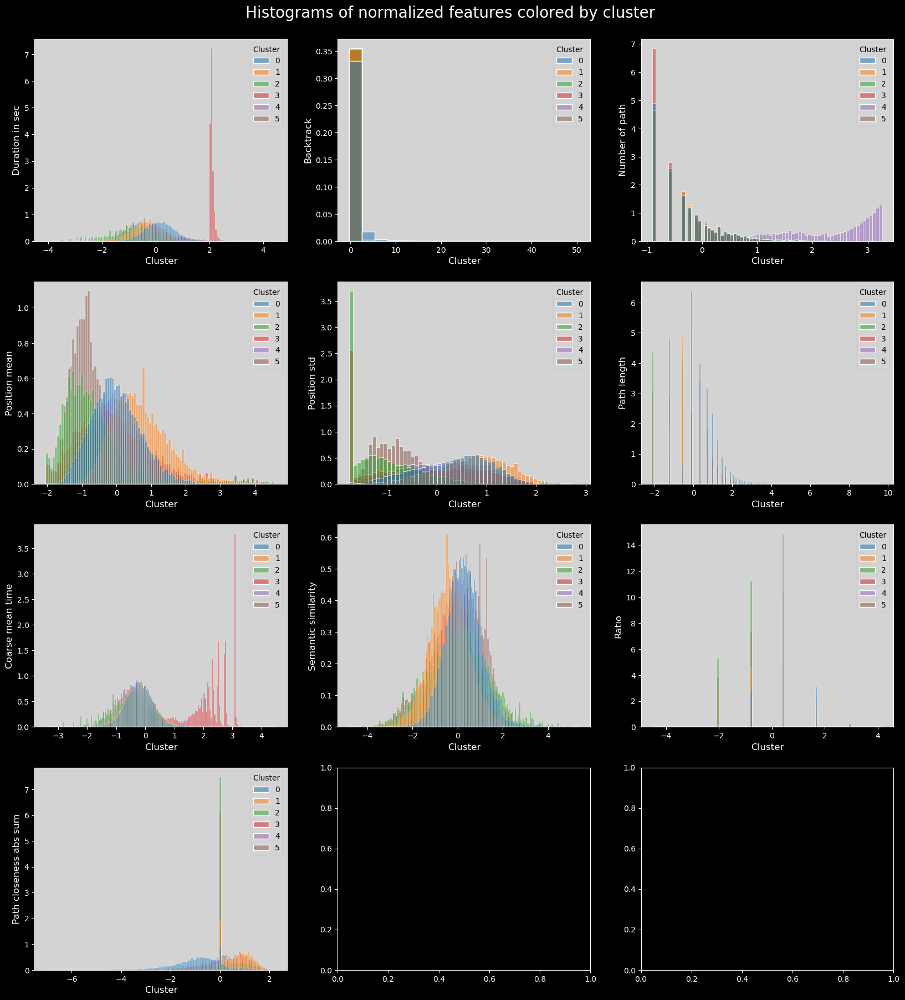

In [9]:
# plot histogram features colored by cluster
with plt.style.context("dark_background"):
    plot_data = combined_df[utils.FEATURES_COLS_USED_FOR_CLUSTERING].copy().dropna()
    plot_data["cluster"] = clustering.labels_
    plot_data["cluster"] = plot_data["cluster"].astype("category")
    n_features = len(plot_data.columns) - 1
    n_cols = 3
    n_rows = int(np.ceil(n_features / n_cols))
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, 20))
    axs = axs.flatten()
    for i, col in enumerate(plot_data.columns):
        if col == "cluster":
            continue
        sns.histplot(
            data=plot_data,
            x=col,
            hue="cluster",
            ax=axs[i],
            stat="density",
            common_norm=False,
            palette="tab10",
        )
        utils.set_axis_style(axs, i)

    plt.suptitle("Histograms of normalized features colored by cluster", fontsize=20)
    plt.subplots_adjust(top=0.95)
    plt.show()

As is visible in the durationinSec plot, the third cluster (in red) concentrates all the longest times taken; this is also visible in coarse_mean_time.

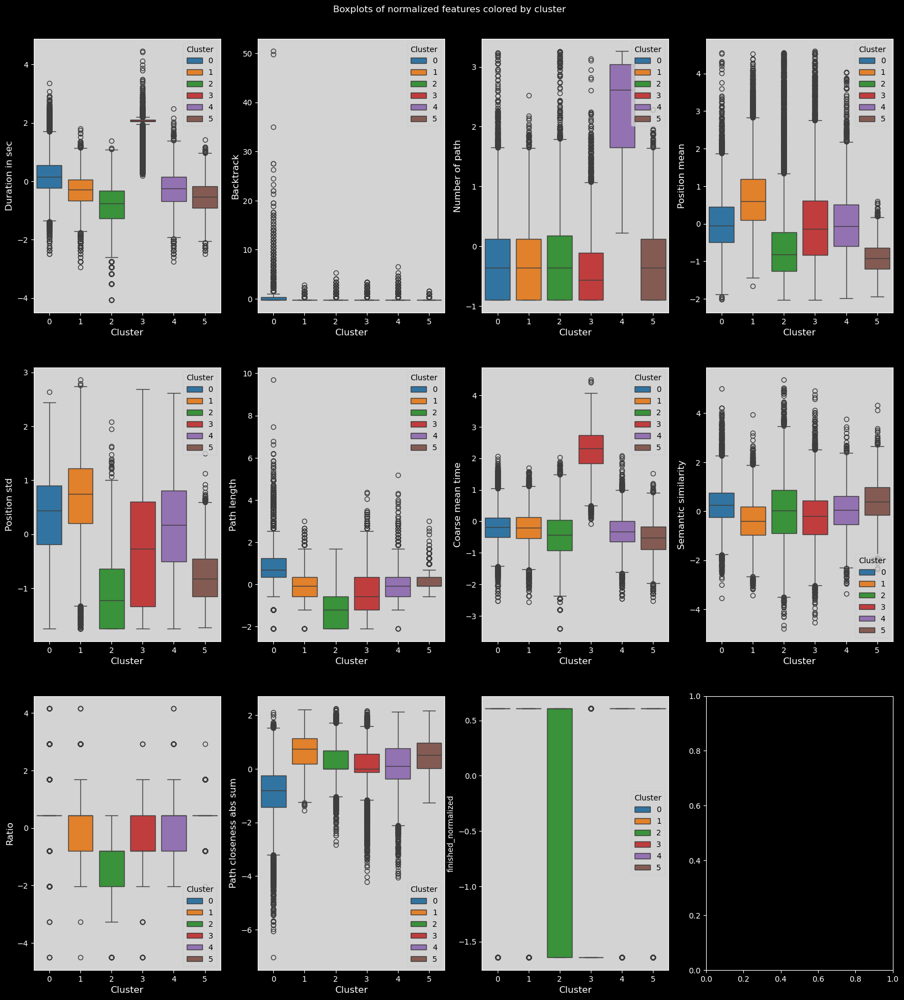

In [15]:
# plot the boxplots of features colored by cluster
with plt.style.context("dark_background"):
    combined_df["finished_normalized"] = (
        combined_df["finished"] - combined_df["finished"].mean()
    ) / combined_df["finished"].std()
    plot_data = combined_df[utils.FEATURES_COLS_USED_FOR_CLUSTERING + ["finished_normalized"]].copy()
    plot_data["cluster"] = clustering.labels_
    plot_data["cluster"] = plot_data["cluster"].astype("category")
    n_features = len(plot_data.columns) - 1
    n_cols = 4
    n_rows = int(np.ceil(n_features / n_cols))
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, 20))
    fig.suptitle("Boxplots of normalized features colored by cluster")
    plt.subplots_adjust(top=0.95)
    axs = axs.flatten()
    for i, col in enumerate(plot_data.columns):
        if col == "cluster":
            continue
        sns.boxplot(data=plot_data, x="cluster", y=col, ax=axs[i], hue="cluster", palette="tab10")
        utils.set_axis_style(axs, i)
    plt.show()

### Heatmap of feature means for each cluster

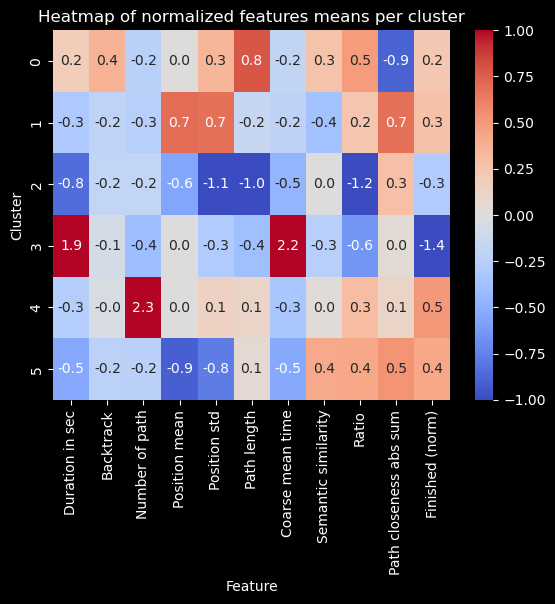

In [11]:
# heatmap of features means per cluster
with plt.style.context("dark_background"):
    means = plot_data.groupby(plot_data["cluster"]).mean()
    sns.heatmap(means, cmap="coolwarm", annot=True, fmt=".1f", vmin=-1, vmax=1)
    plt.title("Heatmap of normalized features means per cluster")
    plt.ylabel("Cluster")
    plt.xlabel("Feature")
    plt.xticks(labels=feat_labels+["Finished (norm)"], ticks=np.arange(len(feat_labels)+1)+0.5, rotation=90)
    plt.show()

### Number of paths per cluster

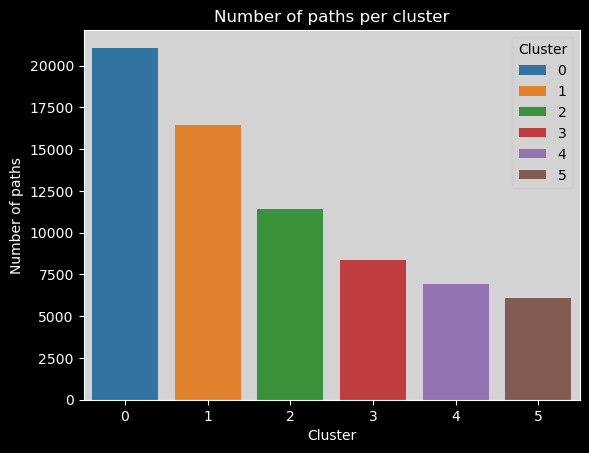

In [12]:
clusters_names,n_points = np.unique(plot_data["cluster"], return_counts=True)
with plt.style.context("dark_background"):
    sns.barplot(x=clusters_names, y=n_points,hue=range(len(clusters_names)), palette="tab10").set_title("Number of paths per cluster")
    # make background grey
    plt.gca().patch.set_facecolor("#d3d3d3")
    # update legend style
    leg = plt.gca().get_legend()
    leg.get_frame().set_facecolor("#d3d3d3")
    leg.set_title("Cluster")
    leg_title = leg.get_title()
    leg_title.set_color("black")
    # change all legend text to black
    [text.set_color("black") for text in leg.get_texts()]
    plt.xlabel("Cluster")
    plt.ylabel("Number of paths")
plt.show()

### Number of timeouts per cluster

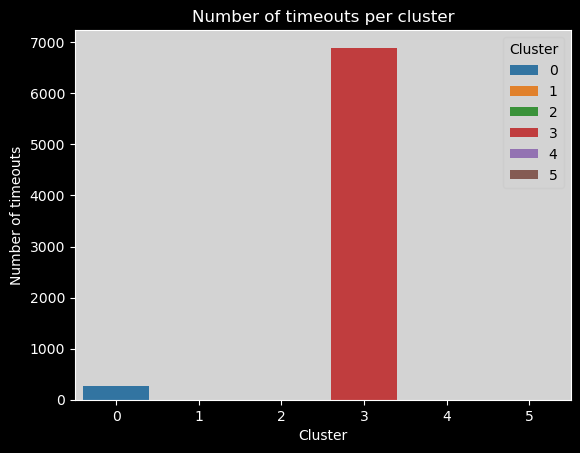

In [13]:
if not FILTER_TIMEOUT:
    # number of timeouts per cluster
    with plt.style.context("dark_background"):
        plot_data["timeout"] = combined_df["type"] == "timeout"
        timeout_per_cluster = plot_data.groupby(plot_data["cluster"])["timeout"].sum()
        sns.barplot(x=clusters_names,
                    y=timeout_per_cluster,
                    hue=range(len(clusters_names)),
                    palette="tab10",
                    ).set_title(
            "Number of timeouts per cluster"
        )
        plt.gca().patch.set_facecolor("#d3d3d3")
        leg = plt.gca().get_legend()
        leg.get_frame().set_facecolor("#d3d3d3")
        leg.set_title("Cluster")
        leg_title = leg.get_title()
        leg_title.set_color("black")
        [text.set_color("black") for text in leg.get_texts()]
        plt.xlabel("Cluster")
        plt.ylabel("Number of timeouts")
    plt.show()

Again, we can here see that most timeouts are in the third cluster.